# Modelos nulos!
dudas y reclamos a javier.vera@pucv.cl

## Introducción

Decir que el **average path lenght** de un grafo $G$ es 4 o que el **coeficiente de clustering** es 0.4 no es muy informativo si no agregamos alguna otra información. ¿Son estos valores típicos o más bien pequeños? La idea es tanto simple como complicada: debemos comparar nuestro grafo con una versión aleatoria -el famoso modelo **nulo**-. Nos basamos en un [link sobre redes en el cerebro](https://www.sciencedirect.com/science/article/pii/B9780124079083000108).

## Nuevamente! grafos de similaridad lingüística

**Pensemos en lenguas y datos.** Existen muchas bases de datos lingüísticas, por ejemplo [SAILS](https://sails.clld.org/) o [WALS](https://wals.info/), en donde cada lengua -digamos $L$- se representa por un conjunto de rasgos $r_1^L,...,r_m^L$. Cada rasgo $r_i^L$, además, tiene un valor (en general, numérico). Estos rasgos han sido registrados por expertas y expertos. 

En términos más precisos, **$L$ se representa por un vector ordenado de números:** ¿Cómo podemos **comparar** lenguas y responder, por ejemplo, las maneras en que las lenguas se agrupan en **familias**? ¿En cuánto se parece el **mapundungun** con el **quechua**? En este taller, nos proponemos definir un **grafo de similaridad $G=(V,E)$**, donde **$V$ es un conjunto de lenguas** y **$E$ es un conjunto de aristas que registran similaridades entre pares de lenguas.** 

## (1) Datos sobre lenguas y familias lingüísticas de las Américas
Extraemos información sobre familias lingüísticas de las Américas desde [Glottolog](https://glottolog.org/).

In [1]:
## usamos pandas para leer los datos

import pandas as pd

In [2]:
## diccionario iso:glottocode
## https://glottolog.org/meta/downloads

langs = pd.read_csv('languages_and_dialects_geo.csv',sep=',')

In [3]:
## nos quedamos con un dataframe con dos columnas: iso vs glottocode

iso_glotto = langs[['isocodes','glottocode']]
iso_glotto = iso_glotto.dropna()

In [4]:
## diccionario iso:glottocode

iso_glotto = dict(zip(iso_glotto['isocodes'], iso_glotto['glottocode']))

In [5]:
## lenguas

print(len(iso_glotto))

7986


In [6]:
## filtramos por lenguas de las Américas

macroarea = langs[['isocodes','macroarea']]
macroarea = macroarea.dropna()

In [7]:
## creamos un diccionario iso:macroarea
## filtramos por macroarea 'South America' y 'North America'

macroarea = dict(zip(macroarea['isocodes'], macroarea['macroarea']))
macroarea = {language:macroarea[language] for language in macroarea.keys() if macroarea[language] in ['South America','North America']}

In [8]:
print(len(macroarea))

1260


In [9]:
## filtramos iso_glotto

iso_glotto = {iso:iso_glotto[iso] for iso in iso_glotto.keys() if iso in macroarea.keys()}

In [10]:
print(len(iso_glotto))

1260


In [11]:
macroarea = {iso_glotto[key]:macroarea[key] for key in macroarea.keys()}

In [12]:
## familias de las Américas

In [13]:
## miramos languoids

languoid = pd.read_csv('languoid.csv',sep=',')

In [14]:
## filtramos id:family_id (family)

id_family = languoid[['id','family_id']]
id_family = id_family.dropna()

In [15]:
## filtramos id:parent_id (genus)

parent_id_family = languoid[['id','parent_id']]
parent_id_family = parent_id_family.dropna()

In [16]:
## transformamos a diccionario

id_family = dict(zip(id_family['id'], id_family['family_id']))
id_family = {language:id_family[language] for language in id_family.keys() if language in iso_glotto.values() and language in macroarea.keys()}

In [17]:
## transformamos a diccionario

parent_id_family = dict(zip(parent_id_family['id'], parent_id_family['parent_id']))
parent_id_family = {language:parent_id_family[language] for language in id_family.keys()}

In [18]:
len(id_family)

1183

In [19]:
len(parent_id_family)

1183

In [20]:
id_family['huil1244']

'arau1255'

In [21]:
parent_id_family['huil1244']

'arau1255'

## (2) Datos de SAILS

Cada lengua de las Américas es representada por un conjunto de rasgos. Esta información es extraída de [SAILS](https://sails.clld.org/). 

In [22]:
## lenguas

languages = pd.read_csv('languages.csv',sep=',')

In [23]:
languages

,ID,Name,Macroarea,Latitude,Longitude,Glottocode,ISO639P3code
0,NOCODE_Apolista,Apolista,NaN,-14.830000,-68.660000,apol1242,NaN
1,NOCODE_Maipure,Maipure,NaN,4.800000,-67.500000,maip1246,NaN
2,aca,Achagua,NaN,4.386490,-72.200500,acha1250,aca
3,acu,Achuar-Shiwiar,NaN,-2.826455,-77.264050,achu1248,acu
4,agr,Aguaruna,NaN,-5.300440,-77.921790,agua1253,agr
...,...,...,...,...,...,...,...
162,yrl,Nhengatu,NaN,1.045027,-66.964553,nhen1239,yrl
163,yuq,Yuqui,NaN,-16.787520,-64.943820,yuqu1240,yuq
164,yuz,Yuracaré,NaN,-16.747880,-65.122410,yura1255,yuz
165,yvt,Yavitero,NaN,2.800281,-68.084219,yavi1244,yvt


In [24]:
## diccionario ID:Glottocode
## usamos esto más adelante: los rasgos están en formato ID

id_glotto = languages[['ID','Glottocode']]
id_glotto = dict(zip(languages['ID'],languages['Glottocode']))

In [25]:
## diccionario glottocode: [name,latitude,longitude]

glotto_geo = languages[['Glottocode','ID','Name','Latitude','Longitude']]

In [26]:
## transformamos a diccionario

glotto = list(glotto_geo['Glottocode'])
id_iso = list(glotto_geo['ID'])
names = list(glotto_geo['Name'])
lat = list(glotto_geo['Latitude'])
lon = list(glotto_geo['Longitude'])

glotto_geo_pairs = []

for i in range(len(glotto)):
    glotto_geo_pairs += [[glotto[i],id_iso[i],names[i],lat[i],lon[i]]]

glotto_geo = {item[0]:[item[1],item[2],item[3],item[4]] for item in glotto_geo_pairs}

In [27]:
## número de lenguas en SAILS

len(glotto_geo)

167

In [28]:
glotto_geo['apol1242']

['NOCODE_Apolista', 'Apolista', -14.83, -68.66]

Rasgos de SAILS!

In [29]:
## rasgos

features_sails = pd.read_csv('features_sails.csv',sep=',')

In [30]:
features_sails

,Unnamed: 0,apol1242,maip1246,acha1250,achu1248,agua1253,yane1238,amar1274,apur1254,apal1257,...,wayo1238,xava1240,kwaz1243,yami1256,yucu1253,nhen1239,yuqu1240,yura1255,yavi1244,zapa1253
0,ARW1,ARW1-NK,ARW1-1,ARW1-0,NaN,NaN,ARW1-1,NaN,ARW1-1,NaN,...,NaN,NaN,NaN,NaN,ARW1-0,NaN,NaN,NaN,ARW1-NK,NaN
1,ARW1-1-03a,ARW1-1-03a-0,ARW1-1-03a-0,ARW1-1-03a-0,NaN,NaN,ARW1-1-03a-0,NaN,ARW1-1-03a-1,NaN,...,NaN,NaN,NaN,NaN,ARW1-1-03a-1,NaN,NaN,NaN,ARW1-1-03a-1,NaN
2,ARW1-1-03b,ARW1-1-03b-NK,ARW1-1-03b-0,ARW1-1-03b-0,NaN,NaN,ARW1-1-03b-0,NaN,ARW1-1-03b-0,NaN,...,NaN,NaN,NaN,NaN,ARW1-1-03b-0,NaN,NaN,NaN,ARW1-1-03b-0,NaN
3,ARW1-1-05,ARW1-1-05-1,ARW1-1-05-1,ARW1-1-05-1,NaN,NaN,ARW1-1-05-1,NaN,ARW1-1-05-1,NaN,...,NaN,NaN,NaN,NaN,ARW1-1-05-1,NaN,NaN,NaN,ARW1-1-05-1,NaN
4,ARW1-1-06,ARW1-1-06-NK,ARW1-1-06-0,ARW1-1-06-0,NaN,NaN,ARW1-1-06-0,NaN,ARW1-1-06-0,NaN,...,NaN,NaN,NaN,NaN,ARW1-1-06-NK,NaN,NaN,NaN,ARW1-1-06-0,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
599,AND5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
600,AND6,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
601,AND7,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
602,AND8,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [31]:
features_sails=features_sails.rename(columns={'Unnamed: 0': 'features'})

In [32]:
len(list(features_sails.columns[1:]))

167

In [33]:
features=list(features_sails['features'])

In [34]:
features_dict = {}

for language in list(features_sails.columns[1:]):
    features_dict[language]=dict(zip(features,list(features_sails[language])))

In [35]:
for language in features_dict:
    D=features_dict[language]
    #D={key:D[key] for key in D.keys() if D[key]!='?'}
    D={k: v for k, v in D.items() if pd.Series(v).notna().all()}
    features_dict[language]=D

familias de las Américas

In [36]:
len(id_family)

1183

In [37]:
id_family = {key:id_family[key] for key in id_family.keys() if key in glotto_geo.keys()}

In [38]:
len(id_family)

142

In [39]:
## agrupamos las lenguas que tienen la misma familia

from collections import defaultdict

v = defaultdict(list)

for key, value in sorted(id_family.items()):
    v[value].append(key)

In [40]:
families = dict(v)

In [41]:
len(families['araw1281'])

37

### (3) Distancias de Hamming

En nuestro caso, utilizamos la **distancia de Hamming** entre lenguas. 

In [42]:
def hamming(glotto1,glotto2):
    d = 0
    n = 0
    language1 = features_dict[glotto1]
    language2 = features_dict[glotto2]
    for feat in language1.keys():
        if feat in language2.keys():
            if language1[feat] != language2[feat]:
                d += 1.0
            n += 1.0
    if n==0:
        return n,-1
    else:
        return n,d/n

In [43]:
hamming('acha1250','apur1254')

(302.0, 0.31125827814569534)

In [44]:
F = ['araw1281','maya1287','quec1387','pano1259','otom1299','tupi1275','nucl1710','cari1283','utoa1244','chib1249','barb1265','ayma1253','arau1255']

### (4) Representación usando grafos

¿Cómo definimos grafos que representen las distancias entre lenguas? En este taller, nos centramos en **$k$-nearest graphs!**

In [45]:
import networkx as nx

def GRAPH_knn(num_rasgos,k):
    
    D = {lengua:{} for lengua in features_dict.keys()}
    for lengua in features_dict.keys():
        for lengualengua in features_dict.keys():
            n,H = hamming(lengua,lengualengua)
            if lengualengua in id_family.keys() and lengua in id_family.keys() and id_family[lengua] in F and id_family[lengualengua] in F and H!=-1:    
                if n>=num_rasgos:
                    D[lengua][lengualengua]=1-H
                    
    G=nx.Graph()
    for key in D.keys():
        D_ordered = list({k: v for k, v in sorted(D[key].items(), key=lambda item: item[1],reverse=True)}.items())[:k]
        D_ordered = [item[0] for item in D_ordered]
        for keykey in D_ordered:
            if G.has_edge(key,keykey)==False:
                G.add_edge(key,keykey,weight=D[key][keykey])
    
    return G

In [46]:
!pip install pydot

You should consider upgrading via the '/home/ec2-user/anaconda3/envs/python3/bin/python -m pip install --upgrade pip' command.


In [47]:
F = ['araw1281','maya1287','quec1387','pano1259','otom1299','tupi1275','nucl1710','cari1283','utoa1244','chib1249','barb1265','ayma1253','arau1255']

import matplotlib.pyplot as plt

def plotG(num_rasgos,k):
    fig, ax = plt.subplots(dpi=800)
    G=GRAPH_knn(num_rasgos,k)
    
    print('número de nodos: '+str(len(G)))
    
    pos = nx.nx_pydot.graphviz_layout(G)#nx.kamada_kawai_layout(G)
    
    nodesA = [node for node in G.nodes() if id_family[node]=='araw1281']
    nodesM = [node for node in G.nodes() if id_family[node]=='maya1287']
    nodesQ = [node for node in G.nodes() if id_family[node]=='quec1387']
    nodesP = [node for node in G.nodes() if id_family[node]=='pano1259']
    nodesO = [node for node in G.nodes() if id_family[node]=='otom1299']
    nodesT = [node for node in G.nodes() if id_family[node]=='tupi1275']
    nodesN = [node for node in G.nodes() if id_family[node]=='nucl1710']
    nodesC = [node for node in G.nodes() if id_family[node]=='cari1283']
    nodesU = [node for node in G.nodes() if id_family[node]=='utoa1244']
    nodesCh= [node for node in G.nodes() if id_family[node]=='chib1249']
    nodesB= [node for node in G.nodes() if id_family[node]=='barb1265']
    nodesAy= [node for node in G.nodes() if id_family[node]=='ayma1253']
    nodesMa= [node for node in G.nodes() if id_family[node]=='arau1255']

    nodesnonA = [node for node in G.nodes() if id_family[node] not in ['araw1281','maya1287','quec1387','pano1259','otom1299','tupi1275','nucl1710','cari1283','utoa1244']]
    
    nx.draw_networkx_nodes(G, pos, nodelist=nodesA, node_size = 40, node_color='orange',node_shape='H',markeredgecolor='k',alpha=0.95,fillstyle='full', linewidths=0.1,label='araw1281') 
    nx.draw_networkx_nodes(G, pos, nodelist=nodesM, node_size = 40, node_color='m',node_shape='X', markeredgecolor='k',alpha=0.95,fillstyle='full',linewidths=0.1,label='maya1287') 
    nx.draw_networkx_nodes(G, pos, nodelist=nodesQ, node_size = 40, node_color='b',node_shape='o',markeredgecolor='k',alpha=0.95,fillstyle='full', linewidths=0.1,label='quec1387') 
    nx.draw_networkx_nodes(G, pos, nodelist=nodesP, node_size = 40, node_color='r',node_shape='s',markeredgecolor='k',alpha=0.95,fillstyle='full', linewidths=0.1,label='pano1259') 
    nx.draw_networkx_nodes(G, pos, nodelist=nodesO, node_size = 40, node_color='cyan',node_shape='D',markeredgecolor='k',alpha=0.95,fillstyle='full', linewidths=0.1,label='otom1299') 
    nx.draw_networkx_nodes(G, pos, nodelist=nodesT, node_size = 40, node_color='yellow',node_shape='*',markeredgecolor='k',alpha=0.95,fillstyle='full', linewidths=0.1,label='tupi1275') 
    nx.draw_networkx_nodes(G, pos, nodelist=nodesN, node_size = 40, node_color='green',node_shape='^',markeredgecolor='k',alpha=0.95,fillstyle='full', linewidths=0.1,label='nucl1710') 
    nx.draw_networkx_nodes(G, pos, nodelist=nodesC, node_size = 40, node_color='olive',node_shape='v',markeredgecolor='k',alpha=0.95,fillstyle='full', linewidths=0.1,label='cari1283') 
    nx.draw_networkx_nodes(G, pos, nodelist=nodesU, node_size = 40, node_color='lime',node_shape='p',markeredgecolor='k',alpha=0.95,fillstyle='full', linewidths=0.1,label='utoa1244') 
    nx.draw_networkx_nodes(G, pos, nodelist=nodesnonA, node_size = 10, node_color='k',alpha=0.25,fillstyle='none',linewidths=0.1,label='Other') 
    nx.draw_networkx_edges(G, pos, alpha=0.5,width=0.25,edge_color='k')
    nx.draw_networkx_nodes(G, pos, nodelist=nodesCh, node_size = 40, node_color='crimson',node_shape='<',markeredgecolor='k',alpha=0.95,fillstyle='full', linewidths=0.1,label='chib1249') 
    nx.draw_networkx_nodes(G, pos, nodelist=nodesB, node_size = 40, node_color='chocolate',node_shape='>',markeredgecolor='k',alpha=0.95,fillstyle='full', linewidths=0.1,label='barb1265') 
    nx.draw_networkx_nodes(G, pos, nodelist=nodesAy, node_size = 40, node_color='slategrey',node_shape='d',markeredgecolor='k',alpha=0.95,fillstyle='full', linewidths=0.1,label='ayma1253') 
    nx.draw_networkx_nodes(G, pos, nodelist=nodesMa, node_size = 40, node_color='fuchsia',node_shape='8',markeredgecolor='k',alpha=0.95,fillstyle='full', linewidths=0.1,label='arau1255') 

    
    plt.title(str(num_rasgos)+' features '+'and '+str(len(G))+' languages',fontsize=10)
    plt.legend(loc='best',fontsize=5)
    plt.axis('off')
    plt.savefig('sails/graph_knn_'+str(num_rasgos)+'.pdf', format='pdf', transparent=True, bbox_inches='tight',dpi=1080)
    plt.show()

número de rasgos 30
número de nodos: 98


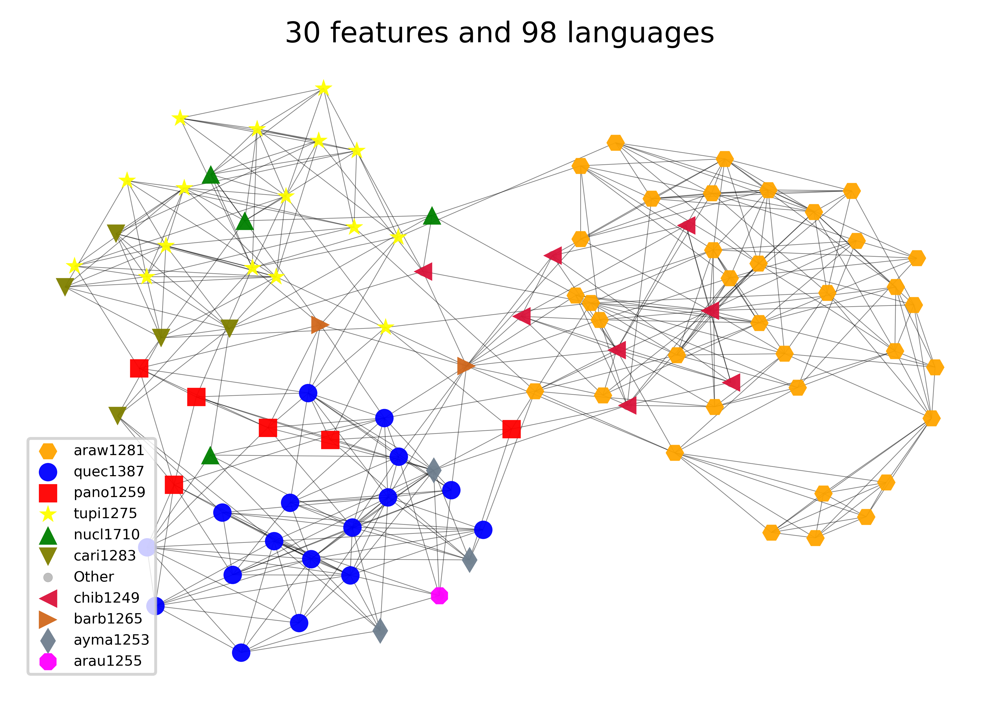

número de rasgos 50
número de nodos: 97


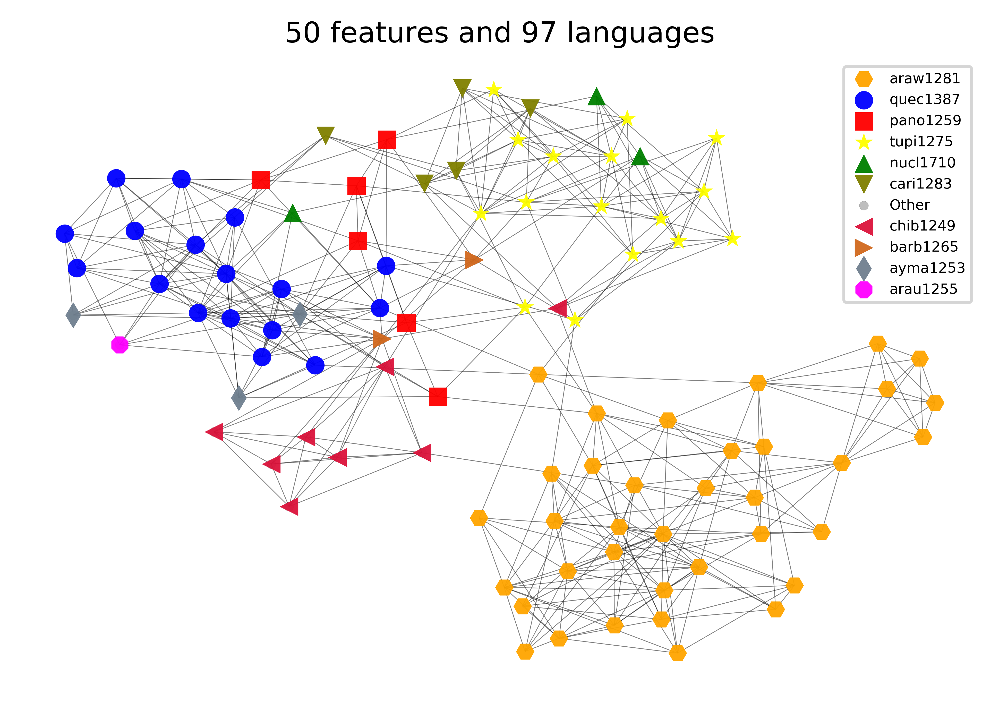

número de rasgos 70
número de nodos: 89


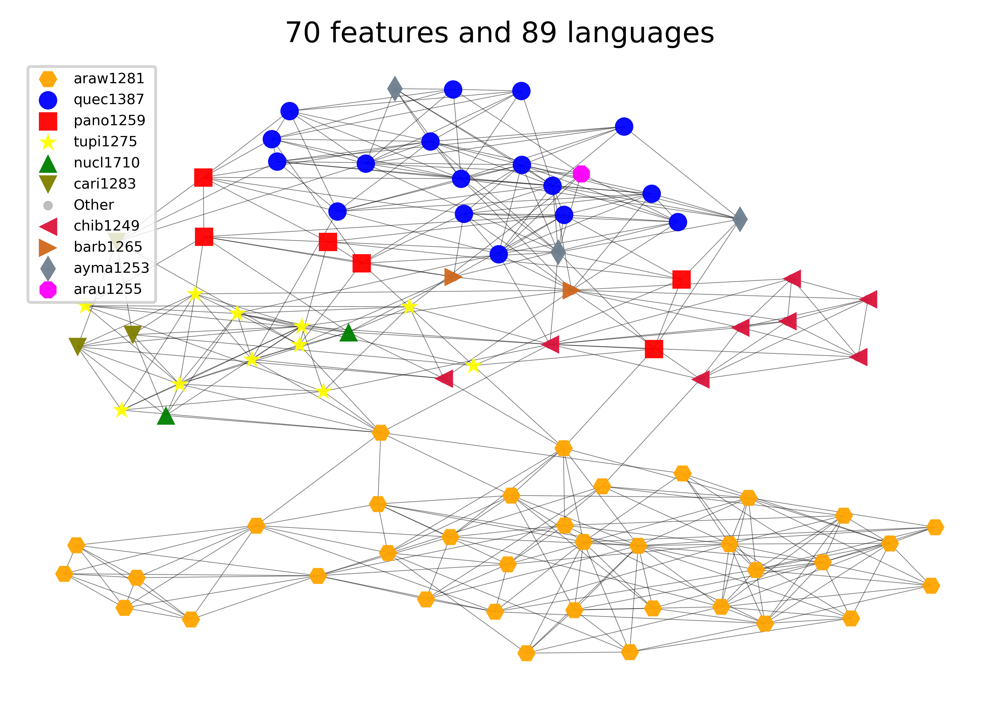

número de rasgos 90
número de nodos: 89


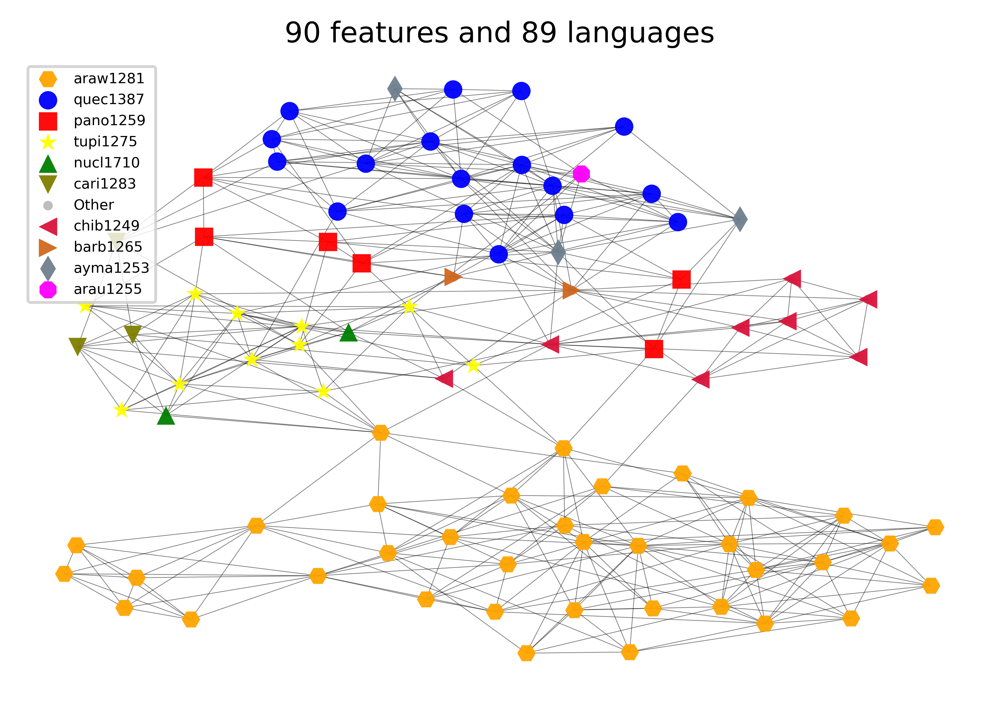

In [48]:
## mostramos la red de lenguas 

for num in [30,50,70,90]:
    print('número de rasgos '+str(num))
    plotG(num,7)

## Modelos nulos!

Comparamos **nuestros grafos** con **modelos nulos.** 

In [64]:
import numpy as np

In [65]:
## elegimos un umbral de número de rasgos

G=GRAPH_knn(30,7)

In [91]:
M = nx.adjacency_matrix(G,weight=None).todense()

In [92]:
M

matrix([[1, 1, 1, ..., 0, 0, 0],
        [1, 1, 1, ..., 0, 0, 0],
        [1, 1, 1, ..., 0, 0, 0],
        ...,
        [0, 0, 0, ..., 1, 0, 0],
        [0, 0, 0, ..., 0, 1, 0],
        [0, 0, 0, ..., 0, 0, 1]], dtype=int64)

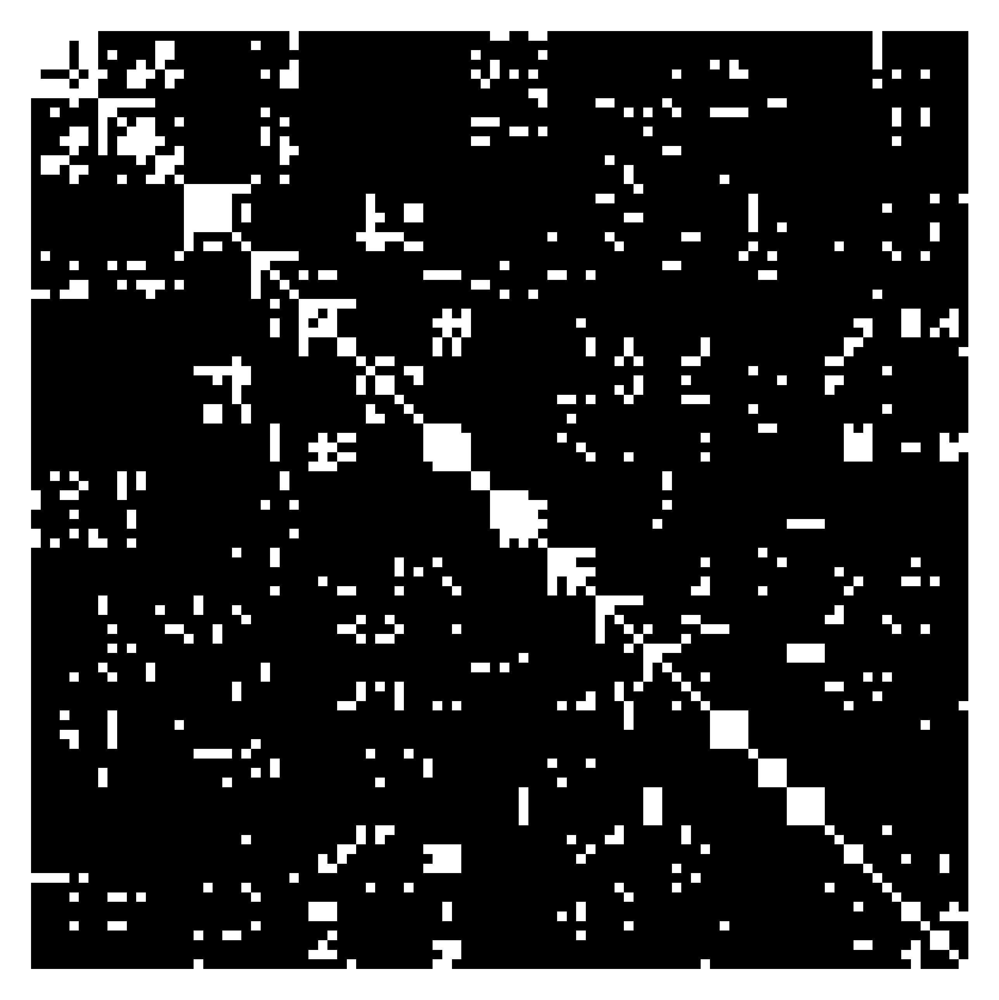

In [95]:
import matplotlib.cm as cm


fig, ax = plt.subplots(dpi=800)  
# 'nearest' interpolation - faithful but blocky
ax.imshow(M, interpolation='nearest', cmap=plt.cm.gray)
plt.axis('off')
plt.savefig('matrix_G.pdf', format='pdf', transparent=True, bbox_inches='tight',dpi=1080)
plt.show()

In [69]:
## algunas medidas de grafos!

clustering = nx.average_clustering(G)
path = nx.average_shortest_path_length(G)
degree = np.mean(list(dict(G.degree()).values()))
density = nx.density(G)

In [70]:
print(clustering)
print(path)
print(degree)
print(density)

0.42729938733998246
2.929307805596465
10.714285714285714
0.11045655375552282


**Primer modelo: randomización de aristas!**
Este [modelo](https://www.sciencedirect.com/science/article/pii/B9780124079083000108) es simple: mantenemos constante el grado promedio y reconectamos aristas aleatoriamente.

![Esquema](swap.png)

In [59]:
## lo hacemos para 100 grafos
swap = []

for i in range(100):
    #print(language)
    G0 = G.copy()
    for i in range(int(len(G0.edges()))):
        nx.connected_double_edge_swap(G0)
    swap.append(G0)

In [60]:
clustering_swap = [nx.average_clustering(g) for g in swap]

In [61]:
path_swap = [nx.average_shortest_path_length(g) for g in swap]

In [71]:
degree_swap = [np.mean(list(dict(g.degree()).values())) for g in swap]

In [62]:
density_swap = [nx.density(g) for g in swap]

In [72]:
print(np.mean(clustering_swap))
print(np.mean(path_swap))
print(np.mean(degree_swap))
print(np.mean(density_swap))

0.1015445023847911
2.223688196928256
10.662244897959187
0.10992005049442456


Para una medida observada $M_{obs}$ es importante medir la razón entre $M_{obs}$ y el promedio de la misma medida para versiones aleatorias, $\langle M_{rand} \rangle$; es decir, $M_{obs}/\langle M_{rand} \rangle$. 

In [75]:
print(clustering/np.mean(clustering_swap))
print(path/np.mean(path_swap))
print(degree/np.mean(degree_swap))
print(density/np.mean(density_swap))

4.208001194597233
1.3173194918437456
1.0048808498420898
1.0048808498420903


**¿Cómo se ve** una de las redes randomizadas?

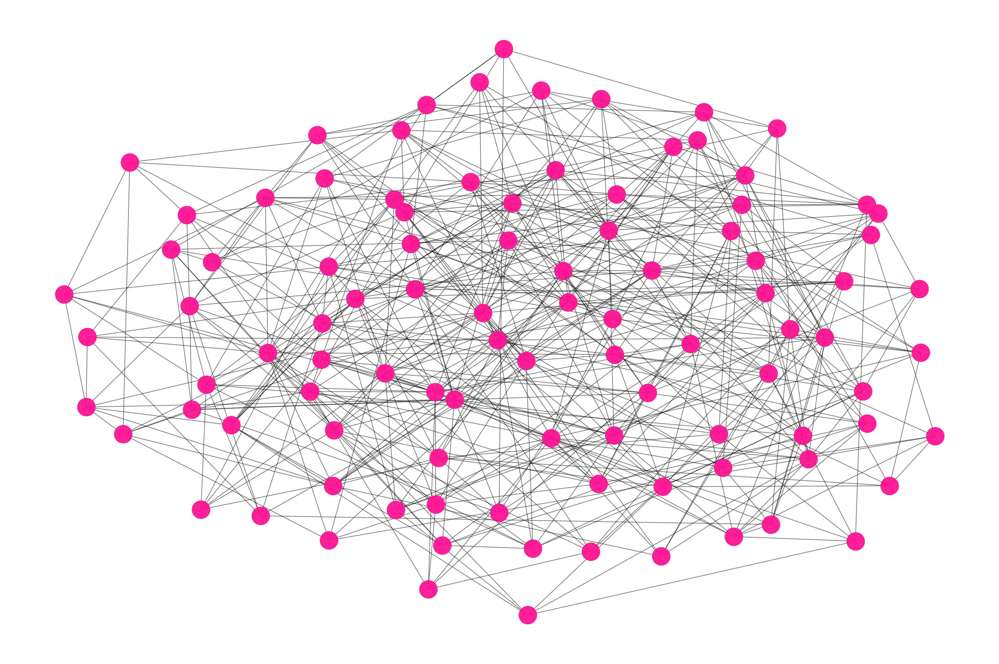

In [81]:
fig, ax = plt.subplots(dpi=800)  
g = swap[0]

pos = nx.nx_pydot.graphviz_layout(g)
nx.draw_networkx_edges(g, pos, alpha=0.5,width=0.25,edge_color='k')
nx.draw_networkx_nodes(g, pos, node_size = 40, node_color='deeppink',node_shape='o',markeredgecolor='k',alpha=0.95,fillstyle='full', linewidths=0.1) 
plt.axis('off')
plt.savefig('sails/swap_example.pdf', format='pdf', transparent=True, bbox_inches='tight',dpi=1080)
plt.show()

¿Qué podemos concluir? **¿Qué propiedades de la red** son relevantes en relación con una versión randomizada?

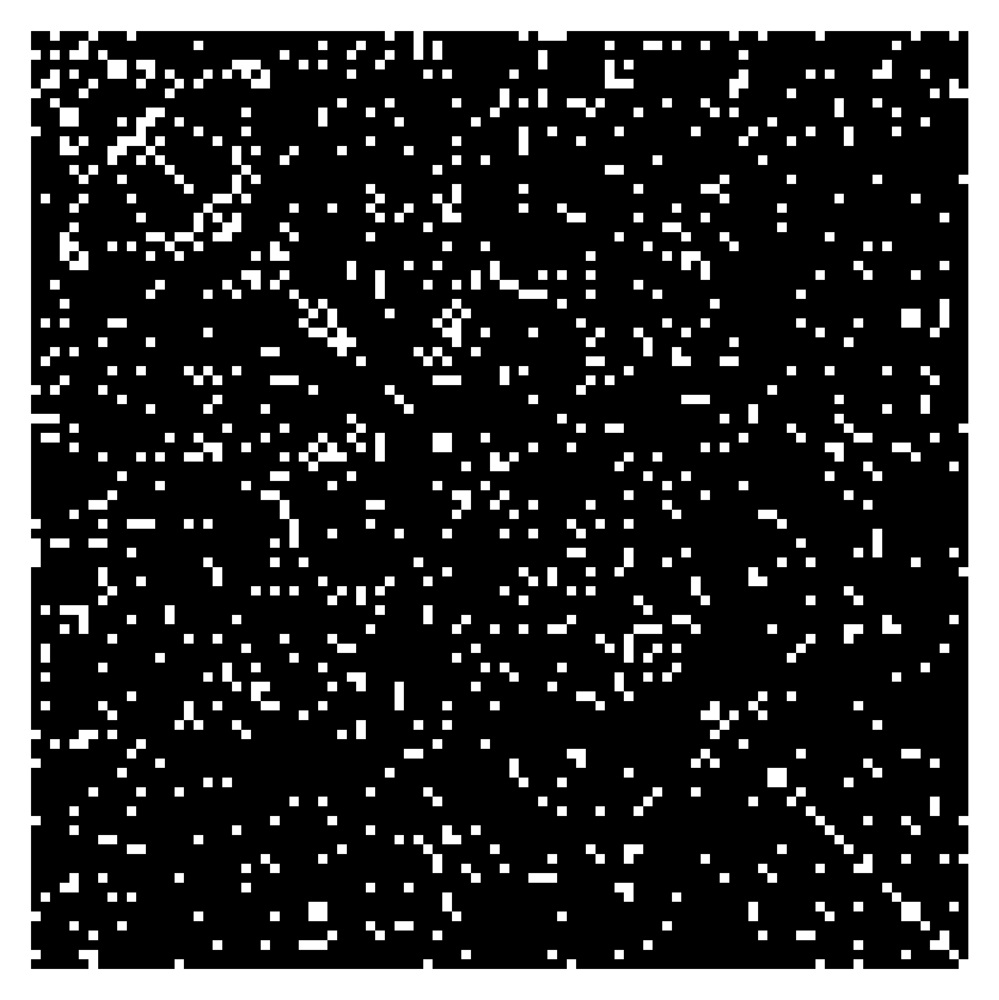

In [97]:
m = nx.adjacency_matrix(g,weight=None).todense()

fig, ax = plt.subplots(dpi=800)  
# 'nearest' interpolation - faithful but blocky
ax.imshow(m, interpolation='nearest', cmap=plt.cm.gray)
plt.axis('off')
plt.savefig('matrix_randomized.pdf', format='pdf', transparent=True, bbox_inches='tight',dpi=1080)
plt.show()